Starting Server

In [1]:
!pip install evadb
# %run eva_server &


# !wget -nc "https://raw.githubusercontent.com/georgia-tech-db/eva/master/tutorials/00-start-eva-server.ipynb"
import os
import time

def shell(command):
    print(command)
    os.system(command)

def stop_eva_server():
    # Kill any process listening on EVA's standard port
    shell('[  -z "$(lsof -ti:5432)" ] || kill -9 "$(lsof -ti:5432)"')

def launch_eva_server():
    # Stop EVA server if it is running
    stop_eva_server()

    os.environ['GPU_DEVICES'] = '0'

    # Start EVA server
    shell("nohup eva_server > eva.log 2>&1 &")

    try:
        with open('eva.log', 'r') as f:
            print(f.read())
    except FileNotFoundError:
        pass

    # Wait for server to start
    time.sleep(10)

def connect_to_server():
    from eva.server.db_api import connect
    %pip install nest_asyncio --quiet
    import nest_asyncio
    nest_asyncio.apply()

    # Connect client with server
    connection = connect(host = '127.0.0.1', port = 5432) 
    cursor = connection.cursor()

    return cursor

# Launch server
launch_eva_server()
cursor = connect_to_server()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
[  -z "$(lsof -ti:5432)" ] || kill -9 "$(lsof -ti:5432)"
nohup eva_server > eva.log 2>&1 &



Downloading Video and models

In [2]:


# A video of a happy person
!wget -nc https://www.dropbox.com/s/gzfhwmib7u804zy/defhappy.mp4

# Adding Emotion detection
!wget -nc https://raw.githubusercontent.com/georgia-tech-db/eva/master/eva/udfs/emotion_detector.py

# Adding Face Detector
!wget -nc https://raw.githubusercontent.com/georgia-tech-db/eva/master/eva/udfs/face_detector.py

#Adding OCR
!wget -nc https://raw.githubusercontent.com/georgia-tech-db/eva/master/eva/udfs/ocr_extractor.py

--2022-12-16 17:14:12--  https://www.dropbox.com/s/gzfhwmib7u804zy/defhappy.mp4
Resolving www.dropbox.com (www.dropbox.com)... 162.125.6.18, 2620:100:601c:18::a27d:612
Connecting to www.dropbox.com (www.dropbox.com)|162.125.6.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/gzfhwmib7u804zy/defhappy.mp4 [following]
--2022-12-16 17:14:12--  https://www.dropbox.com/s/raw/gzfhwmib7u804zy/defhappy.mp4
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc690ed8353a5d9ceae3b85b9e7d.dl.dropboxusercontent.com/cd/0/inline/Bytlk90pmhR_DJfMx2dKfuMrjblFz-xUcmR8ajCHU6jslWKs8fA5GpISVLFc4G9tHDNA6oY2tXANXQQh7I4OTlEq2kfOcHEtYAmva2_l5FyT7PCArU8PSO4wPwnXnyddUM7AdD3CEjCP8iZmExa67mmL2wOD4bl0NZdO4bOVuA7rfg/file# [following]
--2022-12-16 17:14:12--  https://uc690ed8353a5d9ceae3b85b9e7d.dl.dropboxusercontent.com/cd/0/inline/Bytlk90pmhR_DJfMx2dKfuMrjblFz-xUcmR8ajCHU6jslWKs8fA5GpISVLFc4G9tHDNA6oY2tXANXQQh

Loading Video into Table

In [3]:
cursor.execute('LOAD FILE "X2Download.app-[VinAI @CVPR 2021] Dictionary-guided Scene Text Recognition.mp4" INTO CRAZY')
response = cursor.fetch_all()
print(response)

@status: ResponseStatus.SUCCESS
@batch: 
                                                                                                      0
0  Video successfully added at location: X2Download.app-[VinAI @CVPR 2021] Dictionary-guided Scene ...
@query_time: 0.09747422400005235


Visualising Video

In [42]:
from IPython.display import Video
Video("X2Download.app-[VinAI @CVPR 2021] Dictionary-guided Scene Text Recognition.mp4", height=450, width=800, embed=True)

Creating UDF using Query

In [4]:
cursor.execute("""CREATE UDF IF NOT EXISTS OCRExtractor
        INPUT (frame NDARRAY UINT8(3, ANYDIM, ANYDIM)) 
        OUTPUT (labels NDARRAY STR(ANYDIM), bboxes NDARRAY FLOAT32(ANYDIM, 4), scores NDARRAY FLOAT32(ANYDIM)) 
        TYPE  OCRExtraction IMPL 'ocr_extractor.py';
        """)
response = cursor.fetch_all()
print(response)


@status: ResponseStatus.SUCCESS
@batch: 
                                                       0
0  UDF OCRExtractor successfully added to the database.
@query_time: 13.170319909


Querying Database for OCR of frames

In [5]:
cursor.execute("""SELECT id, OCRExtractor(data)
                  FROM CRAZY WHERE id<2""")
response = cursor.fetch_all()
print(response)

@status: ResponseStatus.SUCCESS
@batch: 
    crazy.id  \
0         0   
1         1   

                                                                                   ocrextractor.labels  \
0  [UNIVERSITY OF, ##VinN, Stony Brook, 0, OREGON, 2, RESEARCH, University, UIt, TRUUNG DHOC, ConG ...   
1  [UNIVERSITY OF, ##VinN, Stony Brook, 0, OREGON, 2, RESEARCH, University, UIt, TRUUNG DHOC, ConG ...   

                                                                                   ocrextractor.bboxes  \
0  [[[692, 22], [922, 22], [922, 48], [692, 48]], [[6, 4], [268, 4], [268, 104], [6, 104]], [[353, ...   
1  [[[692, 22], [922, 22], [922, 48], [692, 48]], [[6, 4], [268, 4], [268, 104], [6, 104]], [[353, ...   

                                                                                   ocrextractor.scores  
0  [0.9885798944634263, 0.3265792347013725, 0.9994667390542697, 0.9935072297872836, 0.9667514037157...  
1  [0.9885798944634263, 0.3265792347013725, 0.9994667390542697, 

Fuzzy Logic 

In [ ]:
!pip install fuzzywuzzy
!pip install python-Levenshtein

In [40]:
import cv2
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
from pprint import pprint
from matplotlib import pyplot as plt

def annotate_video(detections, input_video_path, output_video_path,s):
    color1=(207, 248, 64)
    color2=(255, 49, 49)
    thickness=4
    
    vcap = cv2.VideoCapture(input_video_path)
    width = int(vcap.get(3))
    height = int(vcap.get(4))
    fps = vcap.get(5)
    fourcc = cv2.VideoWriter_fourcc('m', 'p', '4', 'v') #codec
    video=cv2.VideoWriter(output_video_path, fourcc, fps, (width,height))
    count = 0
    frame_id = 0
    # Capture frame-by-frame
    # ret = 1 if the video is captured; frame is the image
    ret, frame = vcap.read() 

    while ret:
        count=0
        df = detections
        df = df[['ocrextractor.bboxes', 'ocrextractor.labels']][df.index == frame_id]
        
        if df.size:
            for rect in df['ocrextractor.bboxes'].values[0]:
              x1 = rect[0][0]
              y1 = rect[0][1]
              x2 = rect[2][0]
              y2 = rect[2][1]
            
            
              label = df['ocrextractor.labels'].values[0][count]
              ratio = fuzz.partial_ratio(label.lower(),s)
              if ratio>70:

            
                x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            # object bbox
                frame=cv2.rectangle(frame, (x1, y1), (x2, y2), color1, thickness) 
            # object label
                cv2.putText(frame, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color2, thickness)
            # object score
            # cv2.putText(img, str(round(score, 5)), (x1+120, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color1, thickness)
            # frame label
                cv2.putText(frame, 'Frame ID: ' + str(frame_id), (700, 500), cv2.FONT_HERSHEY_SIMPLEX, 1.2, color2, thickness) 
                video.write(frame)
              count+=1
            # Show every fifth frame
            
            plt.imshow(frame)
            plt.show()
        
        frame_id+=1
        ret, frame = vcap.read()

    video.release()
    vcap.release()

Getting frames and location of strings only PARTIALLY matching with string

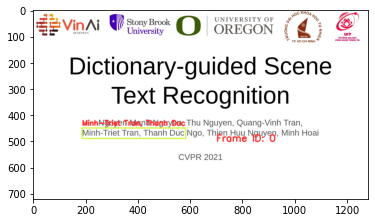

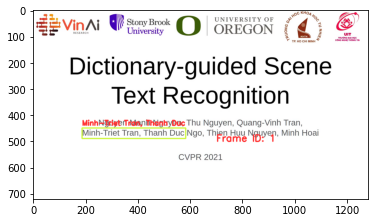

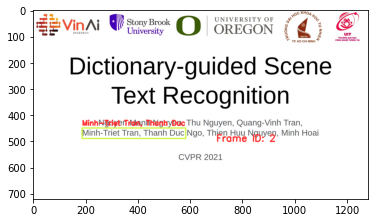

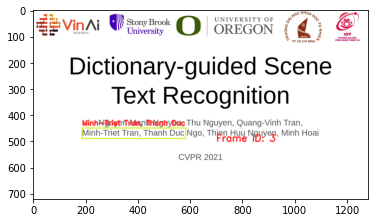

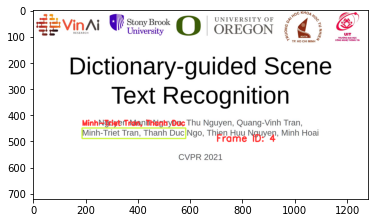

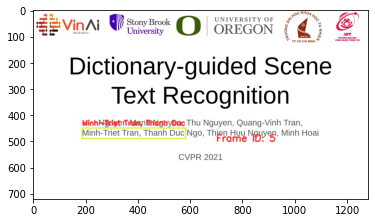

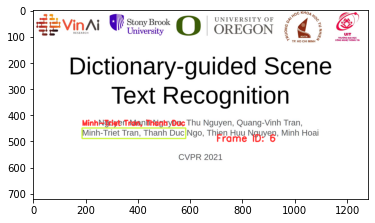

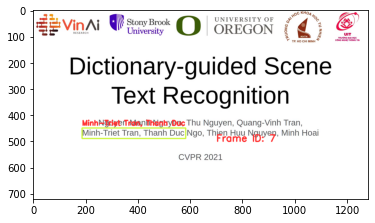

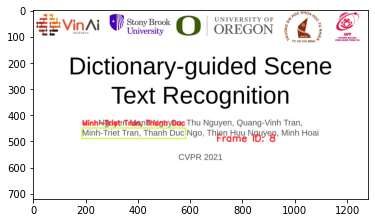

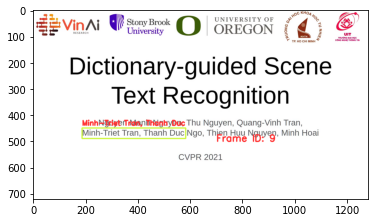

In [44]:
from ipywidgets import Video, Image
input_path = 'X2Download.app-[VinAI @CVPR 2021] Dictionary-guided Scene Text Recognition.mp4'
output_path = 'video.mp4'

dataframe = response.batch.frames
annotate_video(dataframe, input_path, output_path,"thanhs")

In [37]:
print(fuzz.partial_ratio("Text Recognition".lower(),"recgnition yescee"))

62
